<a href="https://colab.research.google.com/github/MohammadJavadSoltani/Thresholding_Labelling/blob/main/Thresholding_and_Labelling_to_Count_the_number_of_ships_in_the_image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

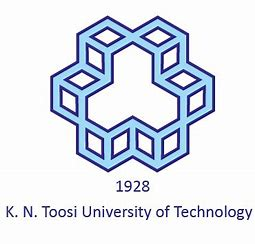

# Thresholding and Labelling to Count the number of ships in the image
mohammad javad soltani ; 

KNTU;



# Q1;
**threshold and find objects**

0: add up all libraries that we need:

In [ ]:
#pip install cvlib

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import label,regionprops,regionprops_table
import pandas as pd
import cvlib as cv
from cvlib.object_detection import draw_bbox
from numpy.lib.polynomial import poly 


1_1:add the pic and plot it :

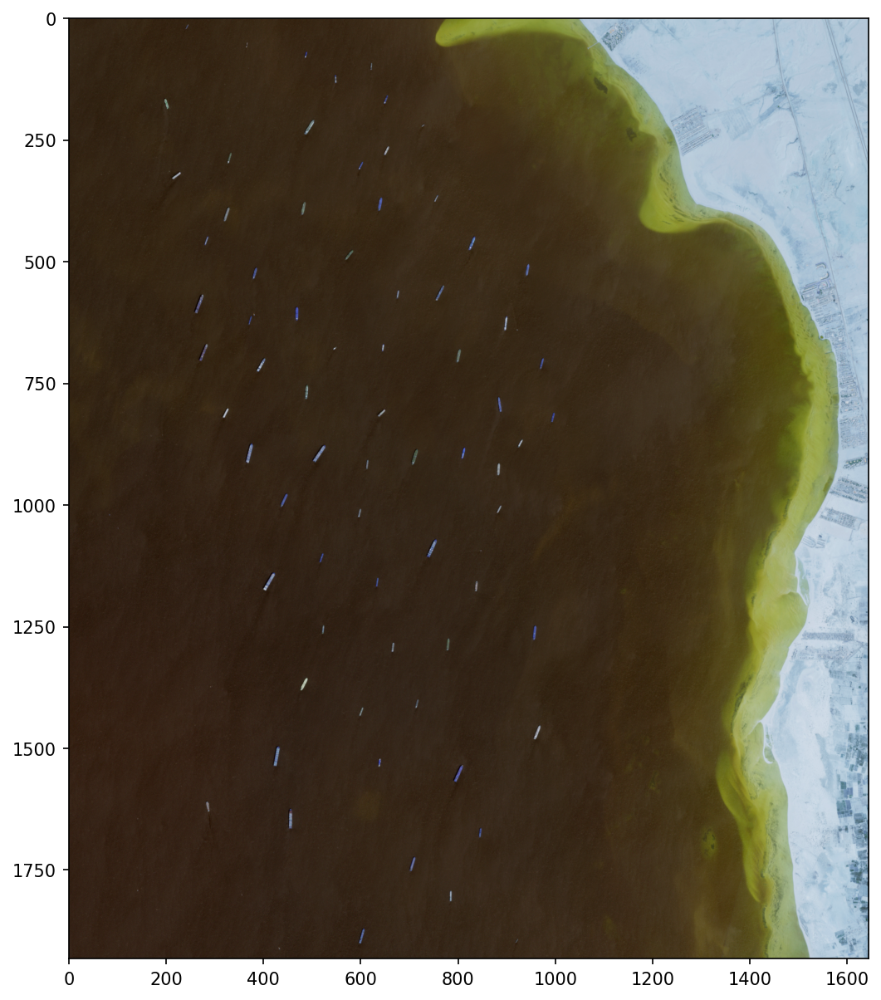

In [ ]:
#from google.colab import files
#img1 = files.upload()
img1 = cv2.imread('Part 1.jpg')
np.shape(img1)
img2 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10,10),dpi=150)
plt.imshow(img1)


and now we show the right pic

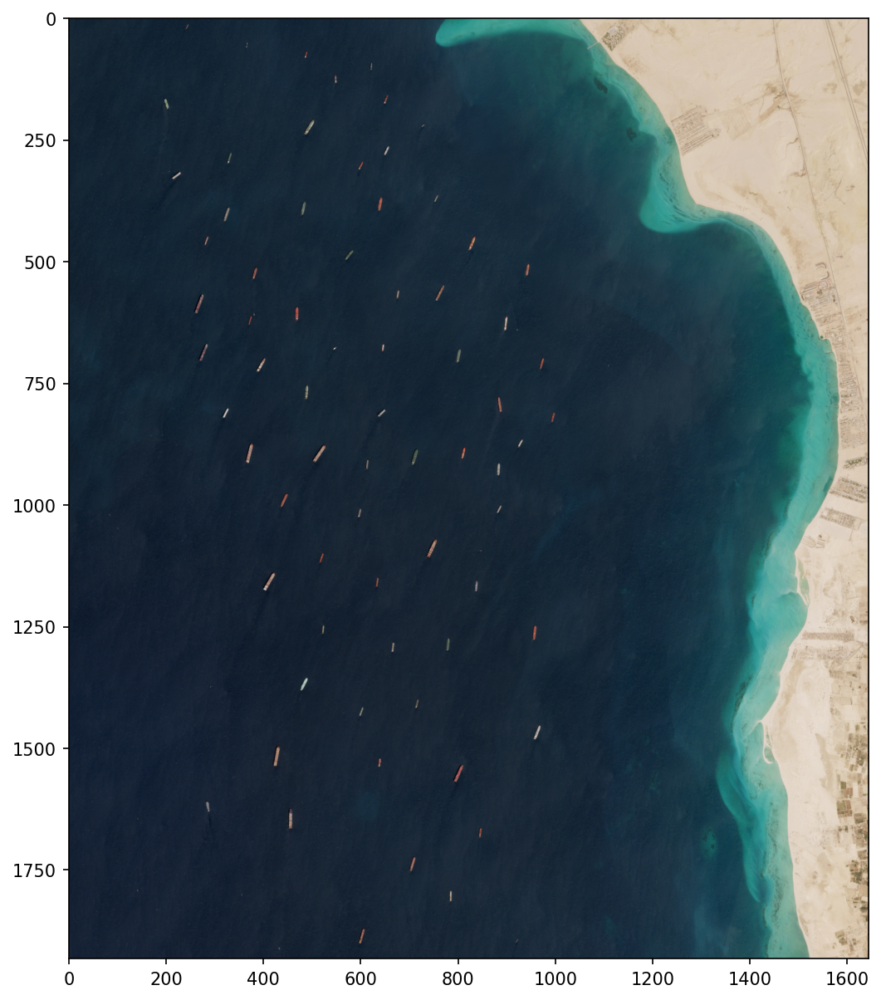

In [ ]:
plt.figure(figsize=(10,10),dpi=150)
plt.imshow(img2)

**its realy better if we use img1 📈 **


---


firs check that if we can label the ship with ***cv*** or not

In [ ]:
box, label, count = cv.detect_common_objects(img1)
output = draw_bbox(img,box,label,count)
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10,10),dpi=150)
plt.axis("off")
plt.imshow(C_img)

error: ignored

so labelling the ships with ***cv*** is not the way! 

we should find another way. 

1_2:plt from band 0 and go to gray scale

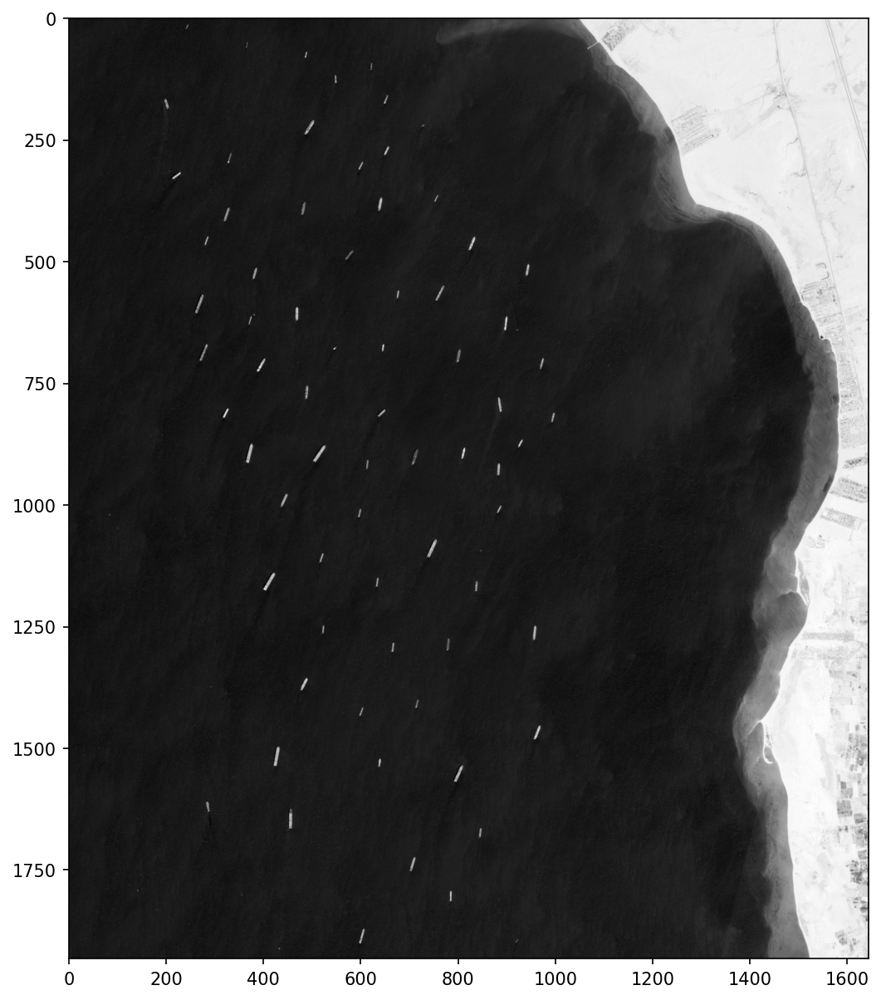

In [ ]:
plt.figure(figsize=(10,10),dpi=150)
plt.imshow(img1[:, :, 2],cmap = 'gray')

now band 1:

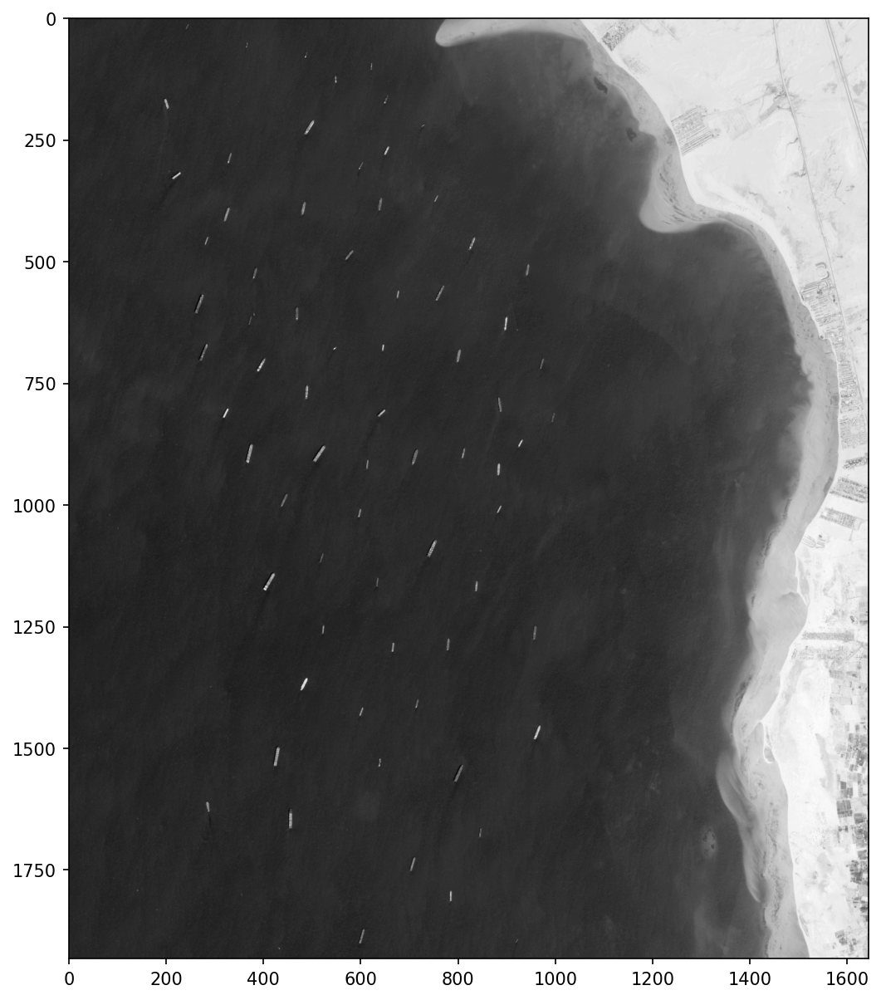

In [ ]:
plt.figure(figsize=(10,10),dpi=150)
plt.imshow(img1[:, :, 1],cmap = 'gray')

and band 0:

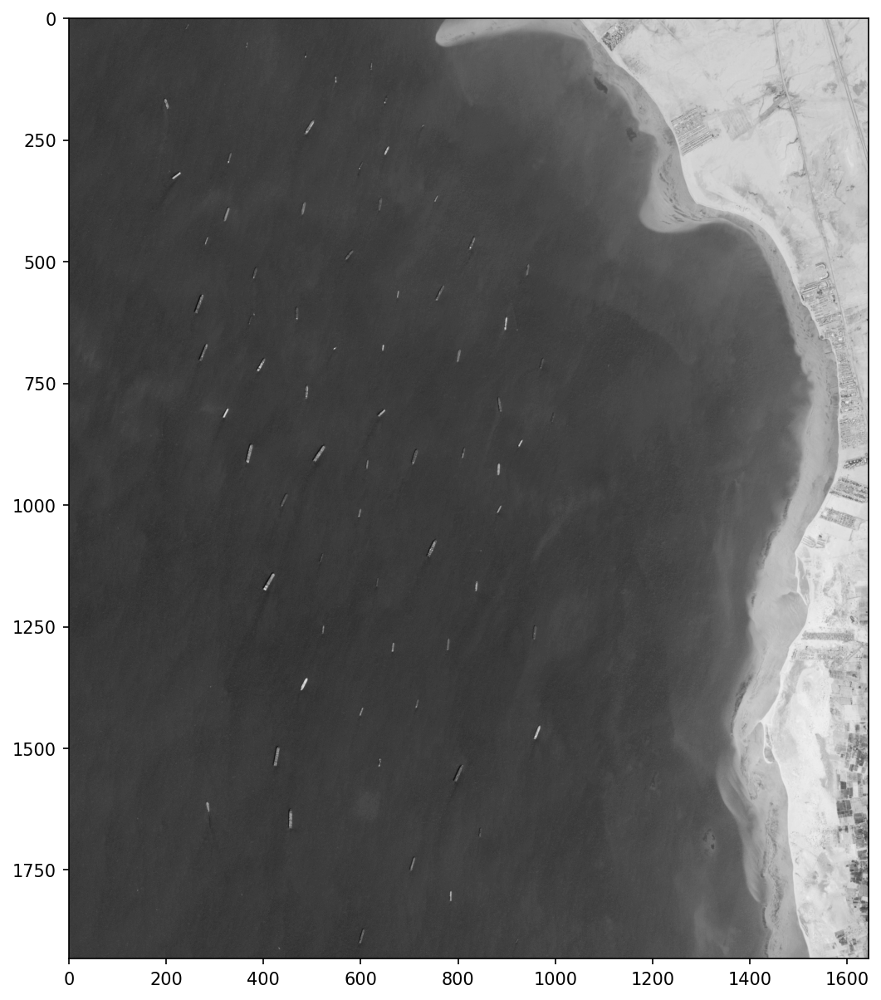

In [ ]:
plt.figure(figsize=(10,10),dpi=150)
plt.imshow(img1[:, :, 0],cmap = 'gray')

# as a result band **2** is the best band for Separation of ships from sea 🤽

2: the hostogram:

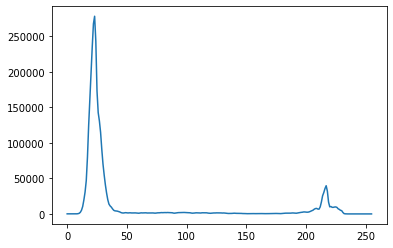

In [ ]:
hist = cv2.calcHist( [img1[:, : , 2]] , [0] , None , [256] , [0,256] )
plt.plot(hist)

about the histogram obviasly the peak in 50 is for sea;


---




**thresholding** 

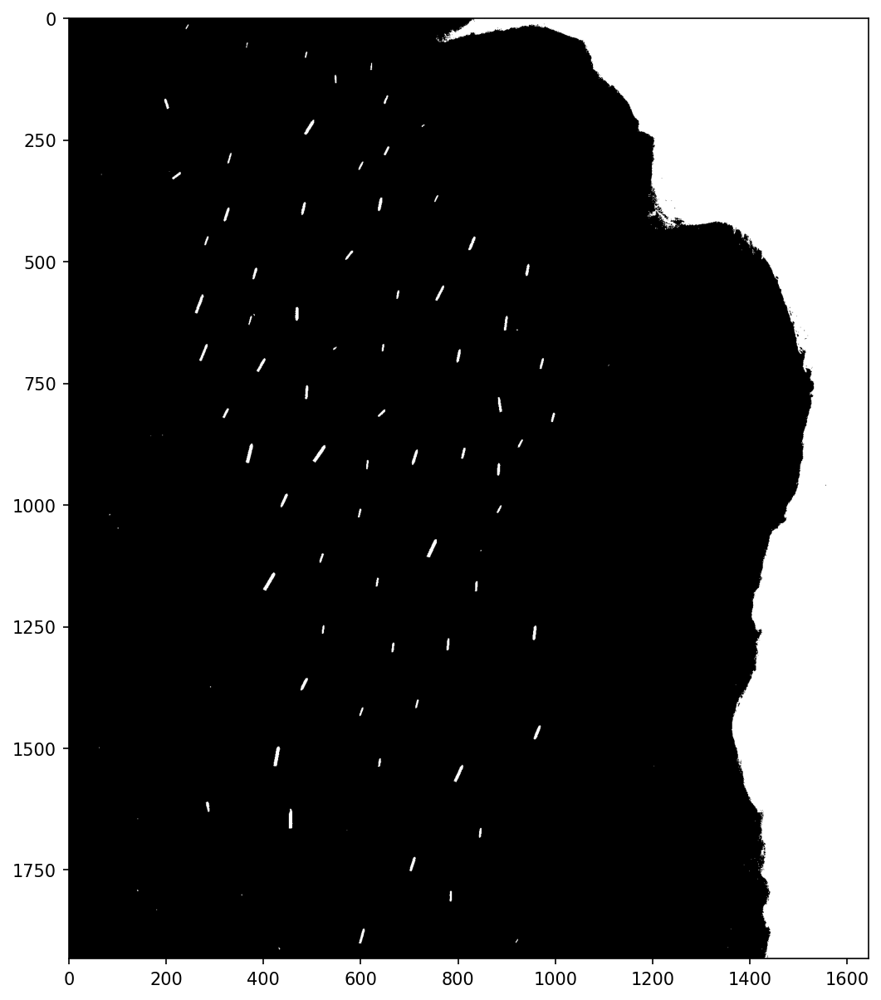

In [ ]:
th = np.zeros_like(img1)
th[img1[:, : , 2] >50] = 1
plt.figure(figsize=(10,10),dpi=150)
plt.imshow(th[:, :, 0],cmap = 'gray')

**and now we should Separate ships from the beach 🏖**


---



add the label is the answer:

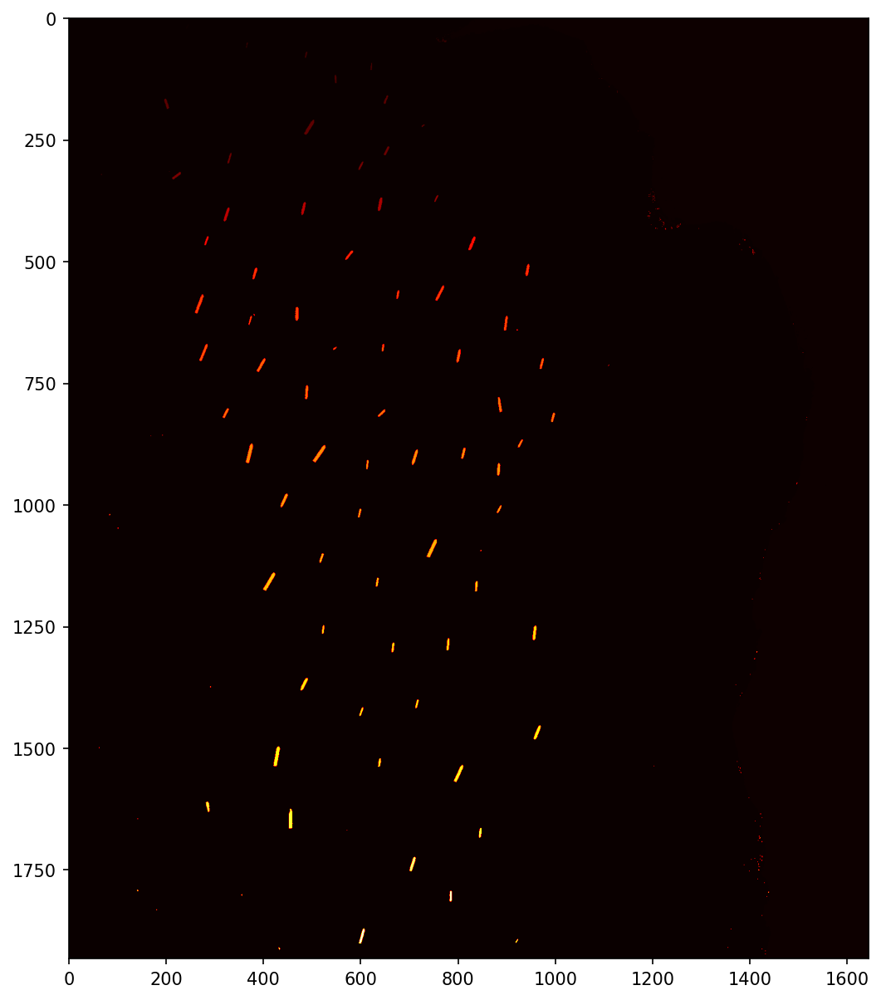

In [ ]:
mylabel = label(th[:, :, 0])
plt.figure(figsize=(10,10), dpi=150)
plt.imshow(mylabel, cmap= 'hot')

we should now that there are some small size label in beach ;

so we shoud not pick them as ships;

 and of course there are some ships thats arent consider in this labeling proces


---



print area for labels:

In [ ]:
props = [ 'label', 'area' ]
table = regionprops_table(mylabel, properties=props)
pd.DataFrame(table)



,label,area
0,1,525818
1,2,24
2,3,1
3,4,3
4,5,1
...,...,...
223,224,9
224,225,1
225,226,1
226,227,1


use np.unique to show all labels include 0:





In [ ]:
np.unique(mylabel, return_counts=True)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

the labels with <1> length are absolutely some bugs and not the ship!

the <0> label is for sea and the <1> is for beach.

the label With a length of less than <10> arent seems to be a ship Because in ENVI i count the pixel number of the smallest ship and was more than 15;by counting errors , 10 is a good number i guess🙂


---










> **now we should see how many ship we have? 🚢**





In [ ]:
i=0
for n in range(228):
  if(table['area'][n]>10):
    i+=1
print(i-1) #the fisr label is not count

74




>  there are almost **74** ships in the image:)




---



and now devide time : 

In [ ]:
cons=-525818 #becouse the area for firs label is 525818 and we should delete it
for n in range(228):
  cons +=table['area'][n]

cons = cons/228     
print(cons)

39.18859649122807


so the average value for ships is **39** .





with that we can devide and the ships with area bigger than 39 are **big ships**

and smaller than 39 are **small ships** 

# **# now part 2 : use histogram equalization:**


---



equalization:

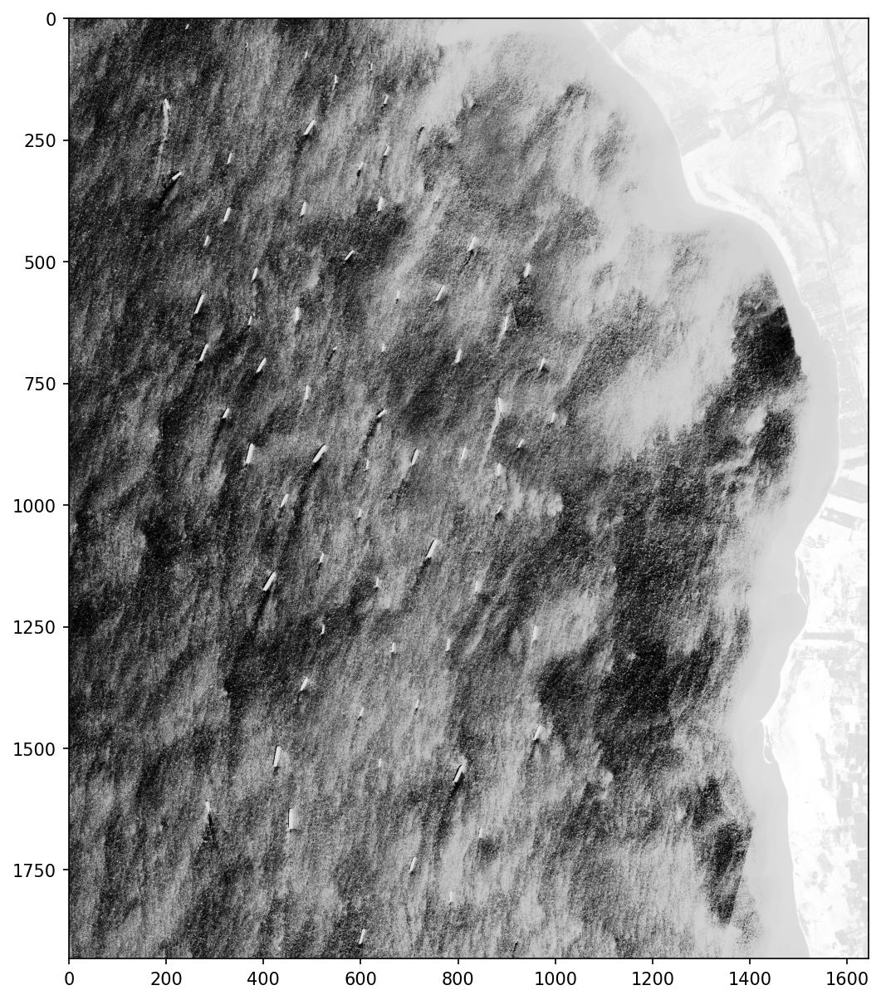

In [ ]:
img_eq0 = cv2.equalizeHist(img1[:, :, 0])
plt.figure(figsize=(10,10), dpi=150)
plt.imshow(img_eq, cmap= 'gray')

now for band 1:

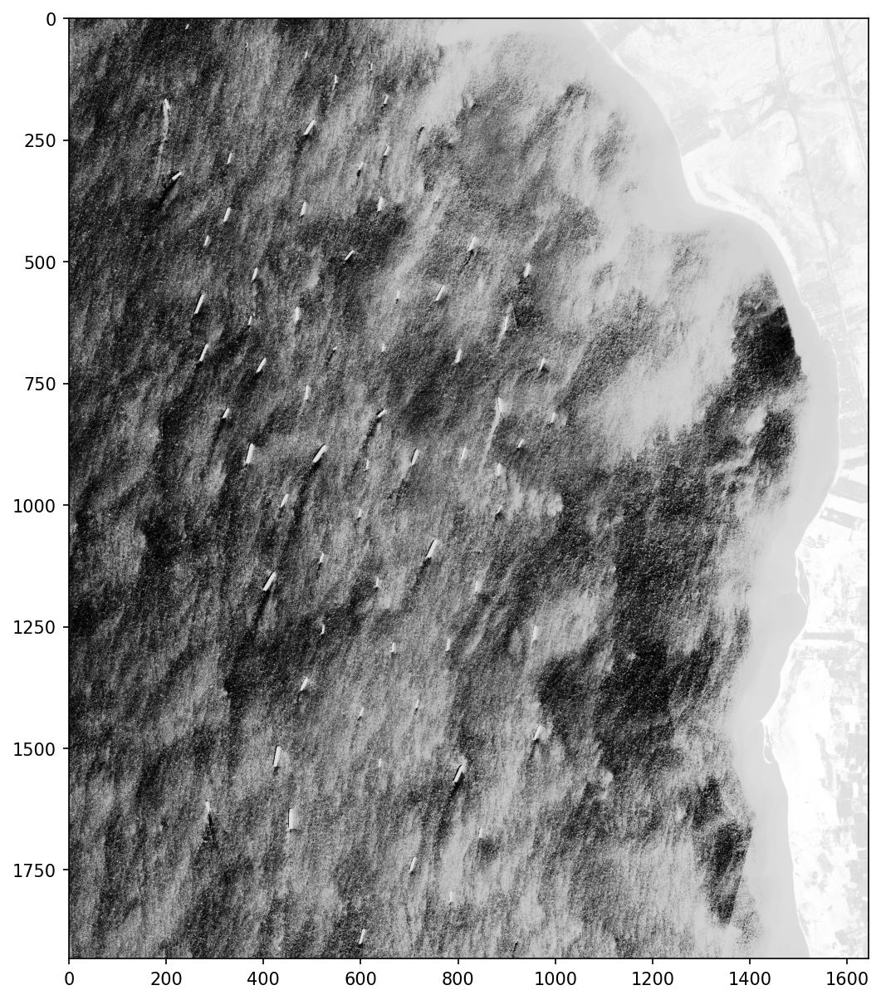

In [ ]:
img_eq1 = cv2.equalizeHist(img1[:, :, 1])
plt.figure(figsize=(10,10), dpi=150)
plt.imshow(img_eq, cmap= 'gray')

now for band 2:

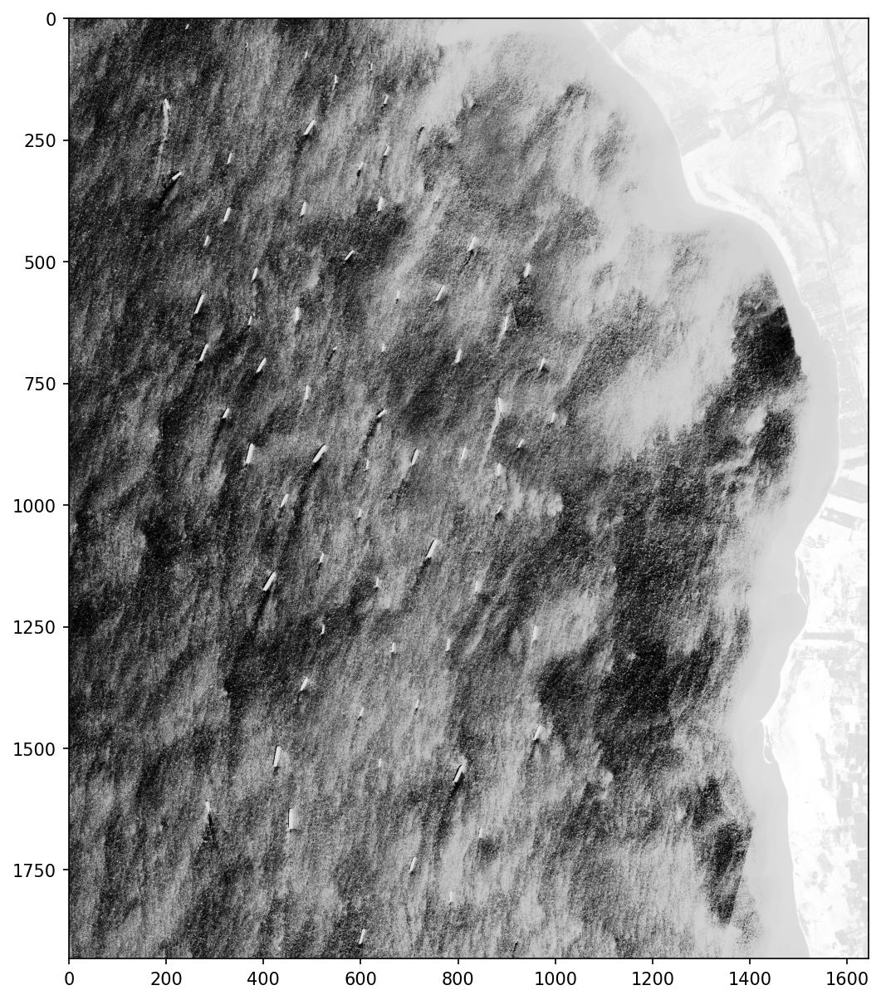

In [ ]:
img_eq2 = cv2.equalizeHist(img1[:, :, 2])
plt.figure(figsize=(10,10), dpi=150)
plt.imshow(img_eq, cmap= 'gray')

print histograms:

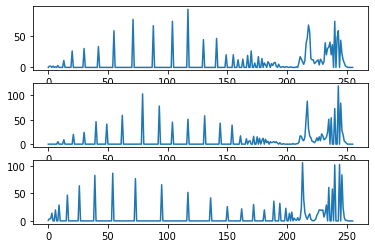

In [ ]:
hist20 = cv2.calcHist(img_eq0,[0],None,[256],[0,256])
hist21 = cv2.calcHist(img_eq1,[0],None,[256],[0,256])
hist22 = cv2.calcHist(img_eq2,[0],None,[256],[0,256])
plt.subplot(3, 1, 1)
plt.plot(hist20)
plt.subplot(3, 1, 2)
plt.plot(hist21)
plt.subplot(3, 1, 3)
plt.plot(hist22)

*note:*
From the comparison of this histogram with the previous histogram, we see that in the previous section, the threshold was easily determined,But here it is a little more difficult to determine the standing limit by which ships can be somewhat separated from beach and water.

note2:by comparing these 3 histograms ,  we will do same for all tree and let see witch one has a better result🥇


---



#  trashold for img_eq0:

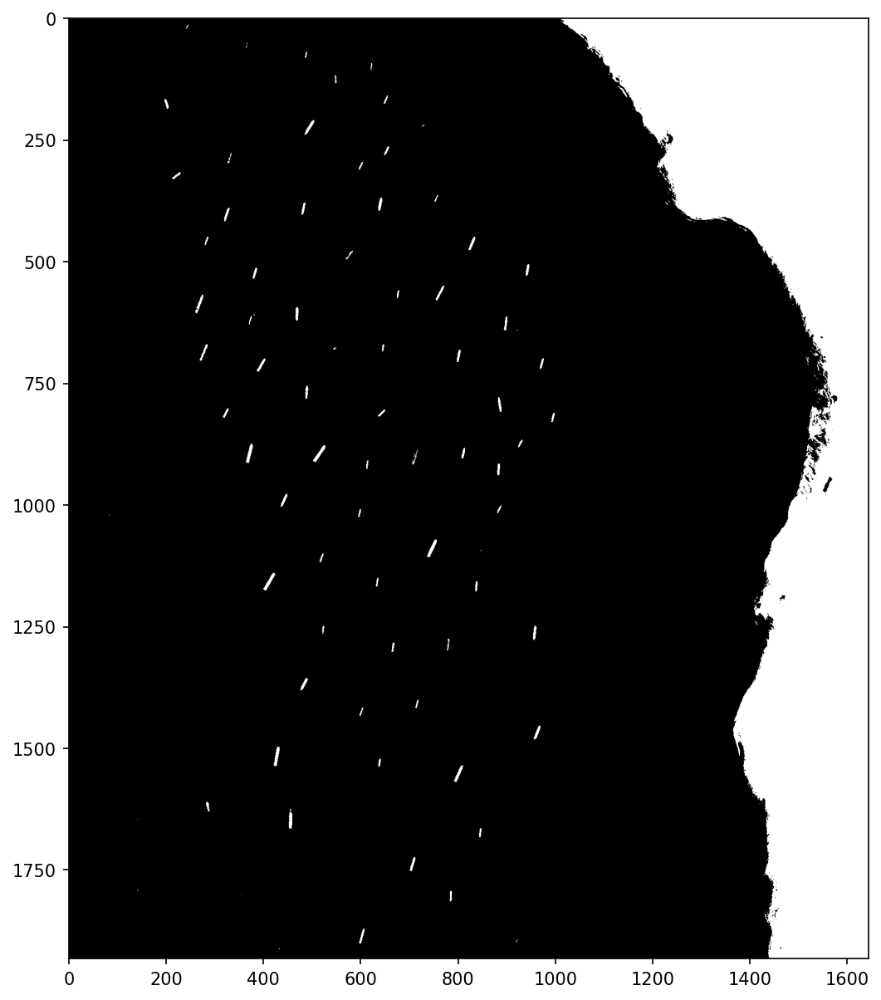

In [ ]:
th2 = np.zeros_like(img_eq0)
th2[np.where(img_eq[:,:]>215)] = 1
plt.figure(figsize=(10,10),dpi=150)
plt.imshow(th2[:, :],cmap = 'gray')

in this step i try all values betwen 185 to 210 and the best one witch doesnt contain many label in next step was 208.
for example 190 may seems good recording to histogram ; but there would be 3000label for that!😰


---



now we consider the labels:

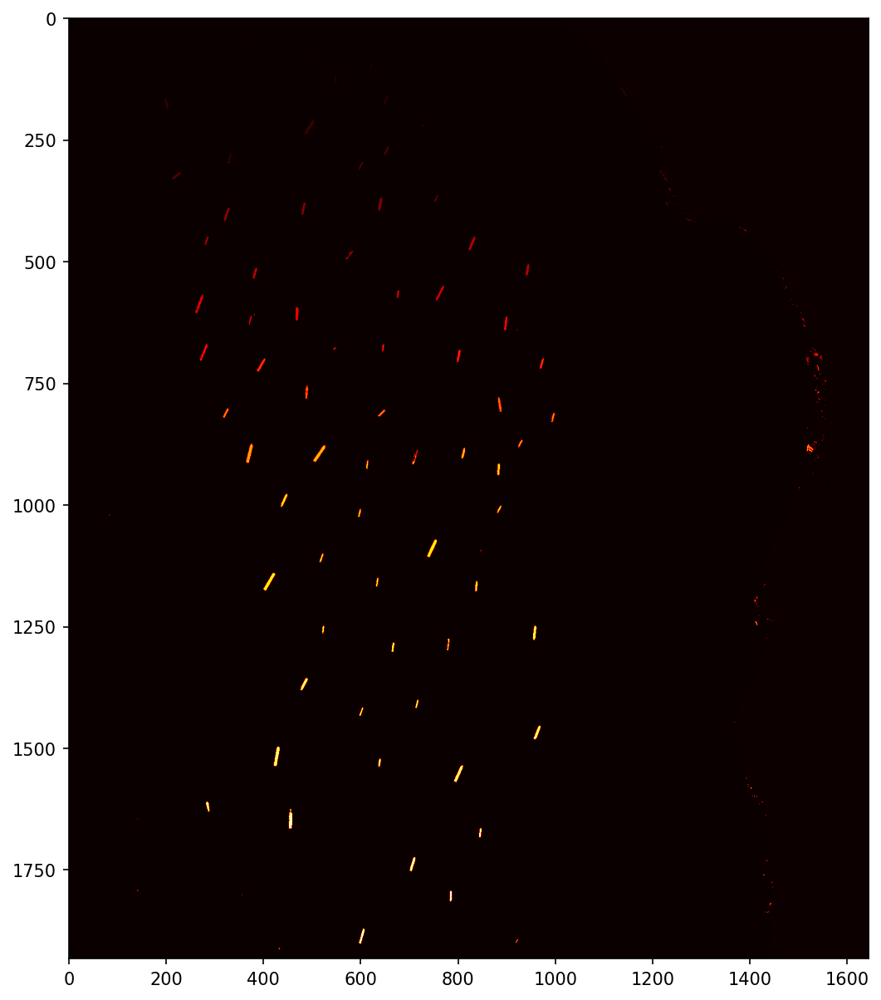

In [ ]:
mylabel2 = label(th2[:, :])
plt.figure(figsize=(10,10), dpi=150)
plt.imshow(mylabel2, cmap= 'hot')

show the result:

In [ ]:
props2 = [ 'label', 'area' ]
table2 = regionprops_table(mylabel2, properties=props2)
pd.DataFrame(table2)


,label,area
0,1,486430
1,2,3
2,3,3
3,4,16
4,5,4
...,...,...
235,236,1
236,237,2
237,238,132
238,239,9


In [ ]:
np.unique(mylabel2, return_counts=True)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

count the ships:

In [ ]:
i=0
for n in range(240):
  if(table2['area'][n]>10):
    i+=1
print(i-1) #the fisr label is not coun

84


result

if we look closer to the beach in last image , we will see that there are some labeled part in that witch have a size bigger than 10.and that will couse of errors.

and in thrasholding if we chose another number , it will couse more label in beach or deleteing some ship .


---




# now trashold for img_eq1:

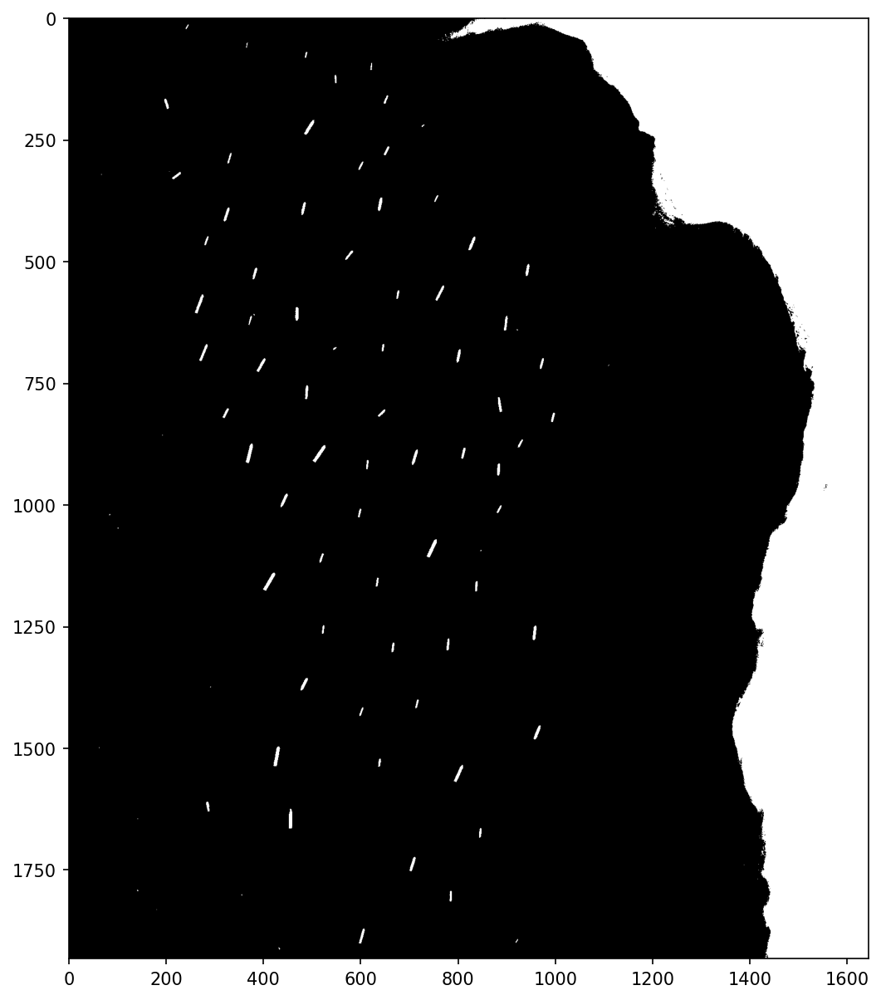

In [ ]:
th3 = np.zeros_like(img_eq1)
th3[np.where(img_eq[:,:]>212)] = 1
plt.figure(figsize=(10,10),dpi=150)
plt.imshow(th3[:, :],cmap = 'gray')

in here i try again all values betwen 200 to 220 and the best one witch doesnt contain many label in next step was 212.


now labelling

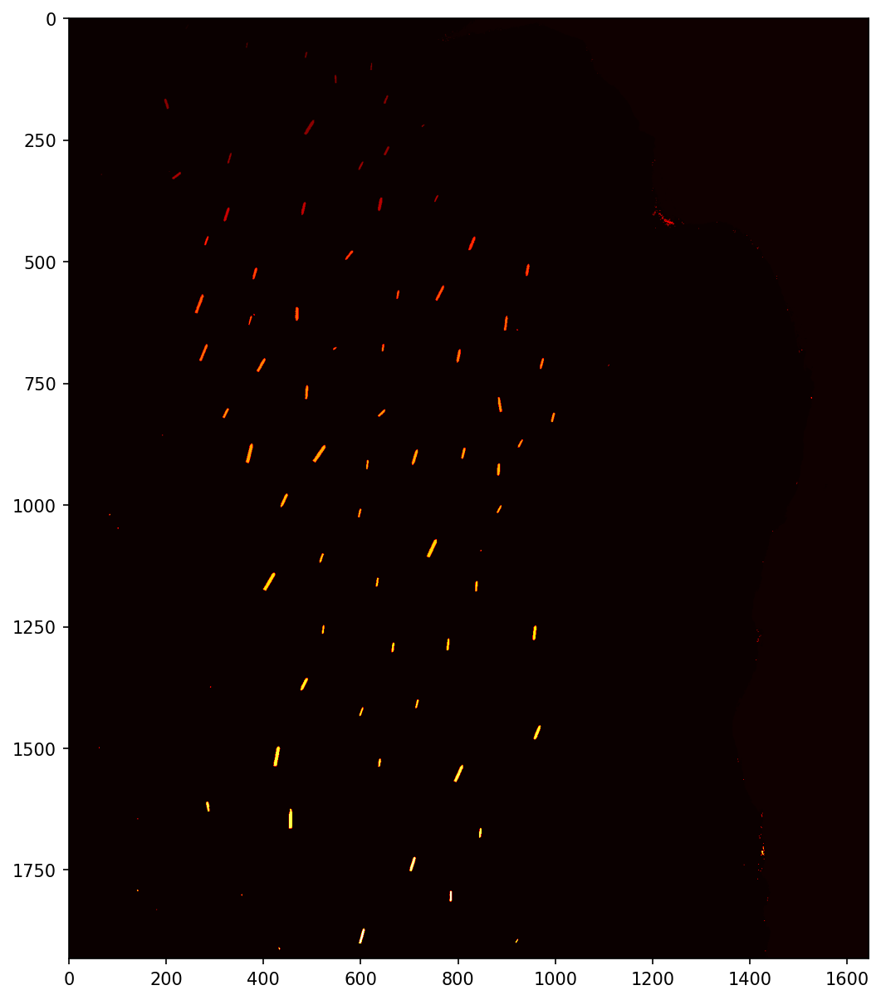

In [ ]:
mylabel3 = label(th3[:, :])
plt.figure(figsize=(10,10), dpi=150)
plt.imshow(mylabel3, cmap= 'hot')

show the result of labelling:

In [ ]:
props3 = [ 'label', 'area' ]
table3 = regionprops_table(mylabel3, properties=props3)
pd.DataFrame(table3)

,label,area
0,1,1
1,2,521502
2,3,4
3,4,1
4,5,24
...,...,...
208,209,1
209,210,151
210,211,16
211,212,9


In [ ]:
np.unique(mylabel3, return_counts=True)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

number of ships:

In [ ]:
i=0
for n in range(213):
  if(table3['area'][n]>10):
    i+=1
print(i-1) #the fisr label is not coun

77


***here we have a better result than Previous one***


---



# now trashold for img_eq2:





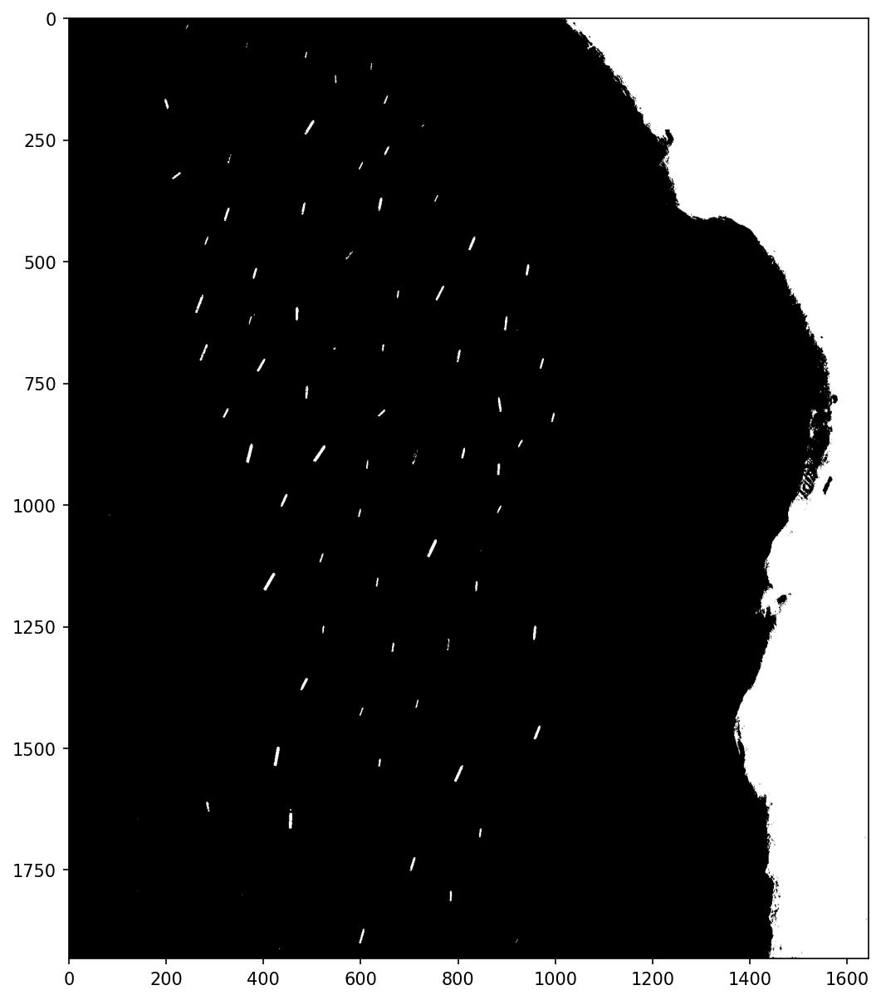

In [ ]:
th4 = np.zeros_like(img_eq1)
th4[np.where(img_eq[:,:]>216)] = 1
plt.figure(figsize=(10,10),dpi=150)
plt.imshow(th4[:, :],cmap = 'gray')

same as before we tried many number too reach out 216

now labelling:

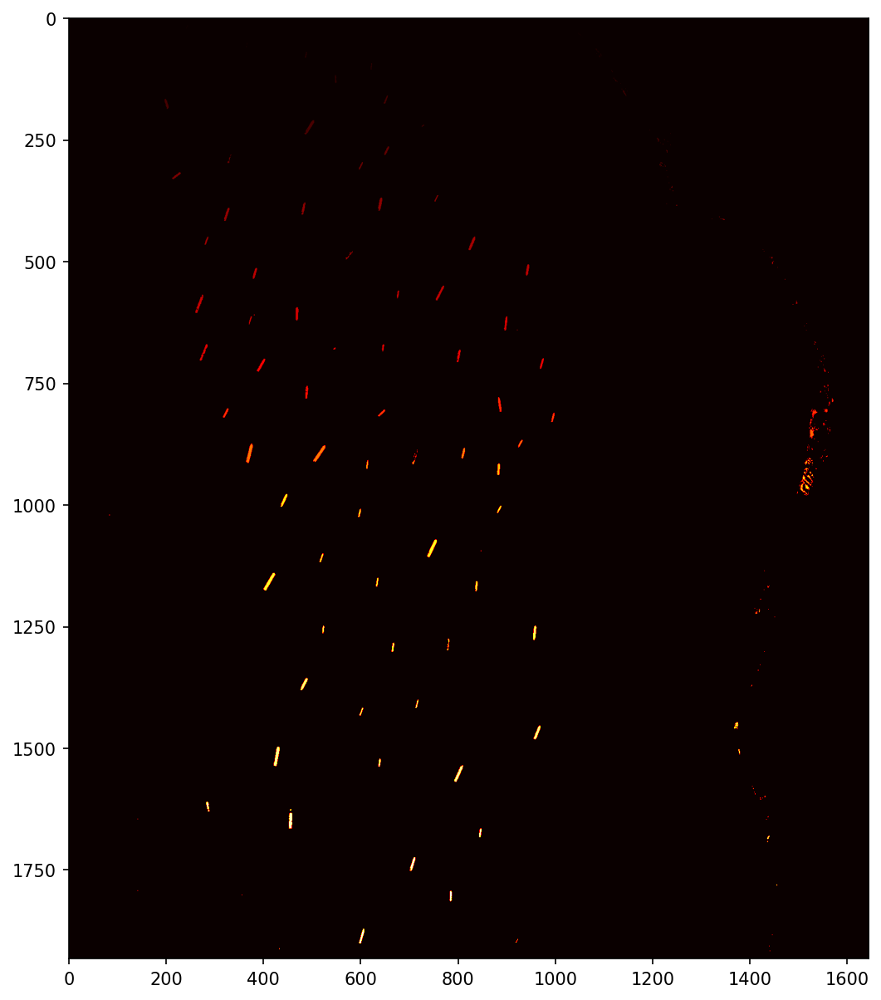

In [ ]:
mylabel4 = label(th4[:, :])
plt.figure(figsize=(10,10), dpi=150)
plt.imshow(mylabel4, cmap= 'hot')

and show the result:

In [ ]:
props4 = [ 'label', 'area' ]
table4 = regionprops_table(mylabel4, properties=props4)
pd.DataFrame(table4)

,label,area
0,1,473243
1,2,1
2,3,1
3,4,14
4,5,1
...,...,...
285,286,1
286,287,8
287,288,1
288,289,2


In [ ]:
np.unique(mylabel4, return_counts=True)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

count the number of sheps:

In [ ]:
i=0
for n in range(290):
  if(table4['area'][n]>10):
    i+=1
print(i-1) #the fisr label is not coun

94


so this was worse than last 2.

so if we wanna have a ranking it would be like:     
🥇img_eq1

🥈img_eq0

🥉img_eq2

**we will do other step just for img_eq1:**

In [ ]:
cons2=-521502 #becouse the area for firs label is 521502 and we should delete it
for n in range(212):
  cons2 +=table3['area'][n]

cons2 = cons2/212     
print(cons2)

41.617924528301884


so the average value for ships is **42** .


the ship with begger area than 42 are **big ships** and oher are **small ships**